In [ ]:
!pip install fredapi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import fredapi
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.animation as animation
import matplotlib.ticker as tick
import datetime as dt
from matplotlib import rc

In [ ]:
def diff_month(d1, d2):
    return (int(d2[:4])- int(d1[:4])) * 12 + int(d2[6:7]) - int(d1[6:7])

In [ ]:
def GetFREDMatrix(seriesnames,progress=False,startdate=None,enddate=None):
    fred = fredapi.Fred(api_key='')
    initialize=True
    for sn in seriesnames:
        if progress: print('Processing ',sn)
        fs=fred.get_series(sn,observation_start=startdate, observation_end=enddate)
        fs=fs.rename(sn)   
        if initialize:
            df=pd.DataFrame(fs)
            initialize=False
        else:
            df=pd.concat([df,fs],axis=1)
    cdates=df.index.strftime('%Y-%m-%d').tolist()
    ratematrix=[list(df.iloc[i]) for i in range(len(df))]
    return(cdates,ratematrix)

In [ ]:
def yield_eigenvecs(k):
  startIndex=dates_dirty.index(s[k].strftime('%Y-%m-%d'))
  endIndex=dates_dirty.index(s[k+11].strftime('%Y-%m-%d'))
  price_data=np.vstack(prices[startIndex:endIndex])
  dif=np.diff(price_data,axis=0)
  df = pd.DataFrame(dif, columns = seriesnames)
  C = df.cov()
  val, vec = np.linalg.eig(C.values)
  vec=vec.T
  p1 = val[0].sum() / np.trace(C)
  p2 = val[1].sum() / np.trace(C)
  p3 = val[2].sum() / np.trace(C)
  return vec, p1, p2, p3

In [ ]:
rc('animation', html='jshtml')
plt.rcParams['animation.embed_limit'] = 2**128
seriesvalues = [1/12, 3/12, 6/12, 1,2, 3, 5, 7, 10, 20, 30]
seriesnames = ['DGS1MO', 'DGS3MO', 'DGS6MO', 'DGS1','DGS2', 'DGS3', 'DGS5', 'DGS7', 'DGS10', 'DGS20', 'DGS30']

startdate= '2001-07-31'
enddate= '2022-09-30'
months=diff_month(startdate, enddate)
s = pd.date_range(startdate, periods=months, freq='BM')
dates_dirty, prices_dirty = GetFREDMatrix(seriesnames, startdate = startdate, enddate = enddate)

nan_list = [any(np.isnan(p)) for p in prices_dirty]
prices = [prices_dirty[i] for i in range(len(prices_dirty)) if not nan_list[i]]
dates = [dates_dirty[i] for i in range(len(dates_dirty)) if not nan_list[i]]

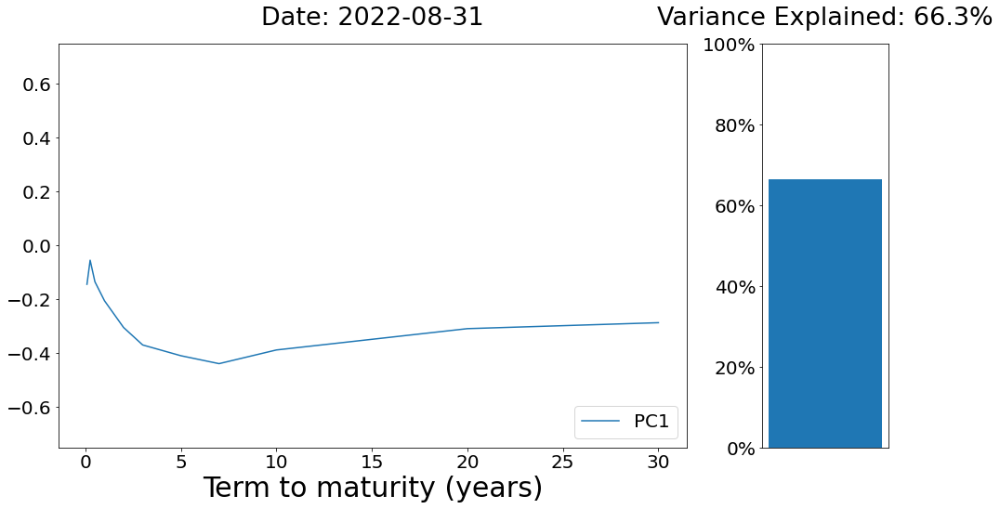

In [ ]:
fig, ax = plt.subplots(1,2,gridspec_kw={'width_ratios': [5, 1]},figsize=(16,8))
i=0
vec, p1, p2, p3 = yield_eigenvecs(i)
ax[0].set_title('Date: '+s[i+11].strftime('%Y-%m-%d'), fontsize=27, pad=20);
ax[1].set_title('Explanatory Power: %.2f%%' % (p1*100), fontsize=27, pad=20);
line1, = ax[0].plot(seriesvalues, vec[0], label='PC1')
#line2, = ax[0].plot(seriesvalues, vec[1], label='PC2')
#line3, = ax[0].plot(seriesvalues, vec[2], label='PC3')
bar1, = ax[1].bar(.5, p1*100)
#bar2, = ax[1].bar(.5, p2*100, bottom=p1*100)
#bar3, = ax[1].bar(.5, p3*100, bottom = (p1+p2)*100)
ax[1].yaxis.set_major_formatter(tick.PercentFormatter())
ax[1].get_xaxis().set_ticks([])
ax[1].set_ylim(0, 100)
ax[0].tick_params(axis="both", labelsize=20)
ax[0].set_xlabel("Term to maturity (years)", fontsize=30);
#ax[0].set_ylabel("Basis point shift", fontsize=30);
ax[1].tick_params(axis="both", labelsize=20)
ax[0].set_ylim([-.75, .75])


def bond_yield_vecs(i):
    vecs, p1, p2, p3 = yield_eigenvecs(i);
    legend = ax[0].legend(loc='lower right', fontsize=20);
    ax[0].set_title('Date: '+s[i+11].strftime('%Y-%m-%d'), fontsize=27, pad=20);
    ax[0].set_xlabel("Term to maturity (years)", fontsize=30);
    ax[0].tick_params(axis="both", labelsize=20)
    
    line1.set_ydata(vecs[0]); # update the data.
    #line2.set_ydata(vecs[1]);
    #line3.set_ydata(vecs[2]);

    ax[1].set_ylim([0, 1]) 
    ax[1].cla() 
    ax[1].set_title('Variance Explained: %.1f%%' % (p1*100), fontsize=27, pad=20);
    ax[1].tick_params(axis="both", labelsize=20)
    ax[1].yaxis.set_major_formatter(tick.PercentFormatter())
    ax[1].get_xaxis().set_ticks([])
    ax[1].bar(.5, p1*100);
    #ax[1].bar(.5, p2*100, bottom= p1*100)
    #ax[1].bar(.5, p3*100, bottom = (p1+p2)*100)
    ax[1].set_ylim(0, 100)
    ax[1].tick_params(axis="both", labelsize=20)
    legend.remove();
    legend = ax[0].legend(loc='lower right', fontsize=20);
    return line1, line2, line3, bar1, legend

boring_bonds = animation.FuncAnimation(fig, bond_yield_vecs, interval=70, blit=True, save_count=months-11)
boring_bonds

In [ ]:
boring_bonds.save("Yield_Vecs_Movie.mp4");